In [15]:
from pathlib import Path
import torch
from flare.dataset import DatasetLoader
from scripts.flare_inference import build_flare_pipeline, run_inference, visualize_image_batch, visualize_image_buffers, prepare_mask_for_metrics, patched_flare_inference
from scripts.util import load_img
from scripts.config import PathConfig
from flare.metrics.metrics import img_mse, img_psnr, img_ssim, perceptual

In [6]:
path_config = PathConfig(
    _working_dir="/home/jsickert/adl4cv",
    run_name="001",
    input_dir="DATA/001",
    output_dir="MODELS",
    flame_path="/home/jsickert/adl4cv/adl4cv_ws25-26_Relightable-Avatars/flare/flame/FLAME2020/generic_model.pkl",
    diffusion_dir=Path("/home/jsickert/adl4cv/flare_diffusion_channels/rgbx/001"),
    train_dir=["MVI_1814", "MVI_1810"],
    eval_dir=["MVI_1812"],
)

In [7]:
dataset_val = DatasetLoader(path_config, train_dir=path_config.eval_dir, sample_ratio=1, pre_load=False)
dataloader_val = torch.utils.data.DataLoader(dataset_val, batch_size=4, collate_fn=dataset_val.collate, shuffle=True, drop_last=True)

In [8]:
mesh, FLAMEServer, deformer_net, shader, renderer, channels_gbuffer, lgt = build_flare_pipeline(
    dataset_val=dataset_val,
    flame_path=path_config.flame_path,
    mesh_path=path_config.experiment_dir / "stage_2/meshes/mesh_latest.obj",
    deformer_path=path_config.experiment_dir / "stage_2/network_weights/deformer_latest.pt",
    shader_path=path_config.experiment_dir / "stage_2/network_weights/shader_latest.pt",
    train_dir=path_config.eval_dir,
)

creating the FLAME Decoder
STAGE 2: Using hashgrid (tinycudann) for intrinsic materials
{'material_mlp_ch': 5, 'light_mlp_ch': 3, 'material_mlp_dims': [64, 64], 'light_mlp_dims': [64, 64]}


In [9]:
for views in dataloader_val:
    break

print(views["frame_name"])

['685', '858', '456', '1667']


## Baseline (vanilla) prediction without any changes

In [10]:
rgb_pred, gbuffers, cbuffers = run_inference(views, mesh, FLAMEServer, deformer_net, shader, renderer, channels_gbuffer, lgt)

Using /home/jsickert/.cache/torch_extensions/py39_cu116 as PyTorch extensions root...
Detected CUDA files, patching ldflags
Emitting ninja build file /home/jsickert/.cache/torch_extensions/py39_cu116/renderutils_plugin/build.ninja...
Building extension module renderutils_plugin...
Allowing ninja to set a default number of workers... (overridable by setting the environment variable MAX_JOBS=N)
Loading extension module renderutils_plugin...


ninja: no work to do.


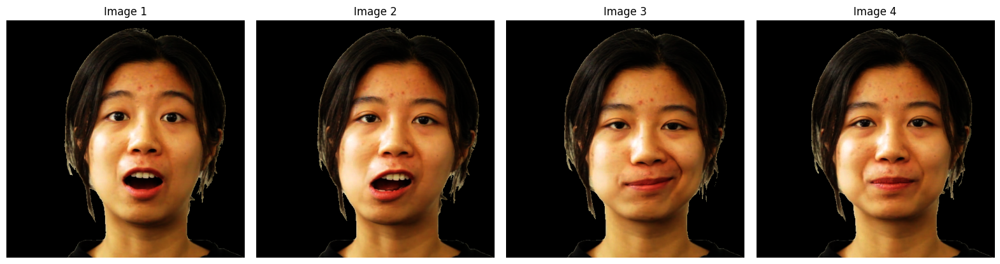

In [11]:
visualize_image_batch(views["img"])

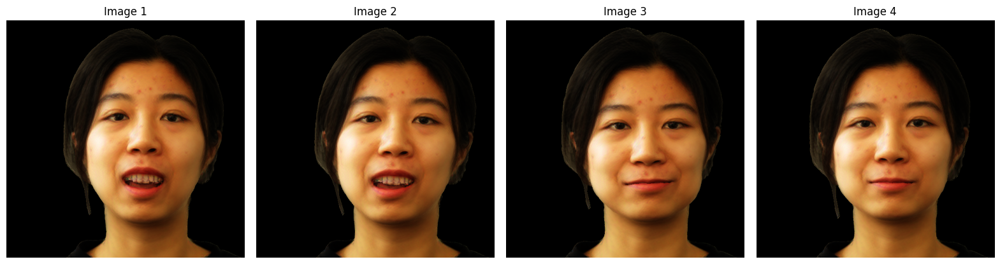

In [12]:
visualize_image_batch(rgb_pred)

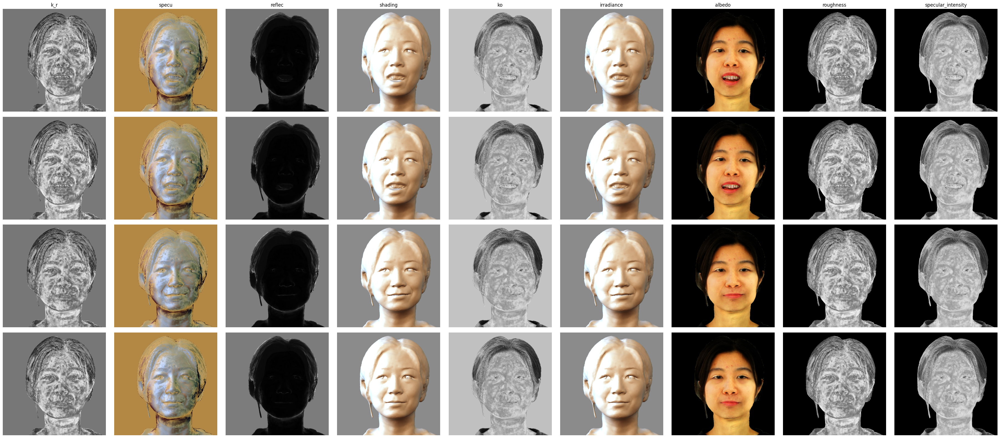

In [13]:
visualize_image_buffers(cbuffers)

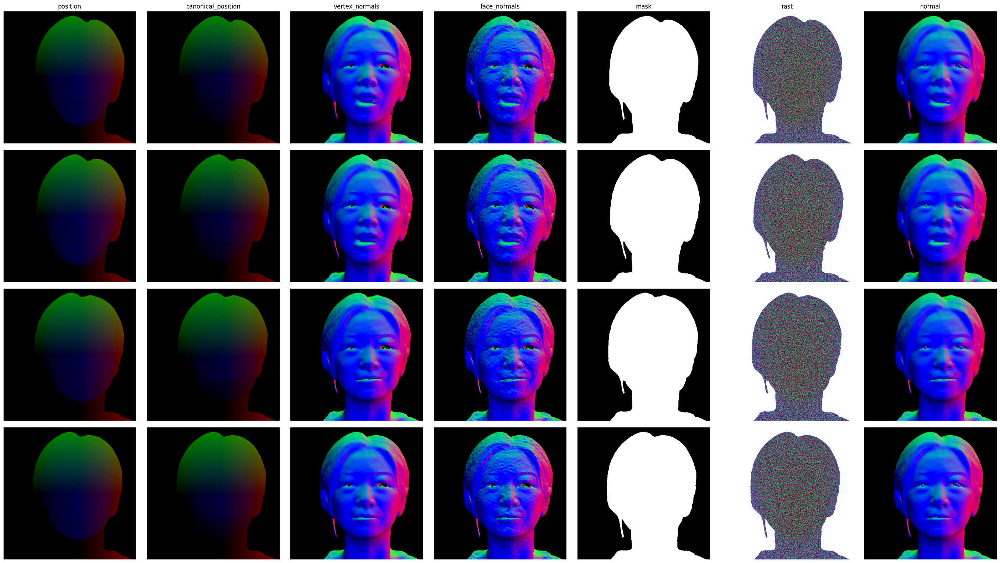

In [14]:
_gbuffers = {}
_gbuffers["position"] = gbuffers["position"]
_gbuffers["canonical_position"] = gbuffers["canonical_position"]
_gbuffers["vertex_normals"] = gbuffers["vertex_normals"]
_gbuffers["face_normals"] = gbuffers["face_normals"]
_gbuffers["mask"] = gbuffers["mask"]
_gbuffers["rast"] = gbuffers["rast"]
_gbuffers["normal"] = gbuffers["normal"]
visualize_image_buffers(_gbuffers)

In [19]:
masked_pred, gt, mask = prepare_mask_for_metrics(rgb_pred, views)

mse, error_mask_mse = img_mse(masked_pred, gt, mask=mask, use_mask=True, return_all=True)
l1, error_mask_l1 = img_mse(masked_pred, gt, mask=mask, use_mask=True, return_all=True, error_type="mae")

print("MSE  :", mse.mean())
print("L1   :", l1.mean())
print("SSIM :", img_ssim(masked_pred, gt).mean())
print("PSNR :", img_psnr(masked_pred, gt, mask=mask).mean())
print("LPIPS:", perceptual(masked_pred, gt).mean())

MSE  : tensor(0.0043)
L1   : tensor(0.0253)
SSIM : tensor(0.8474)
PSNR : tensor(23.7165)
LPIPS: tensor(0.1393)


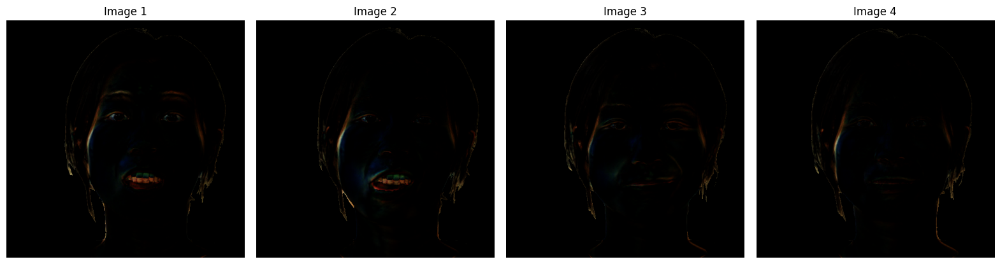

In [20]:
visualize_image_batch(error_mask_mse.permute(0, 2, 3, 1))

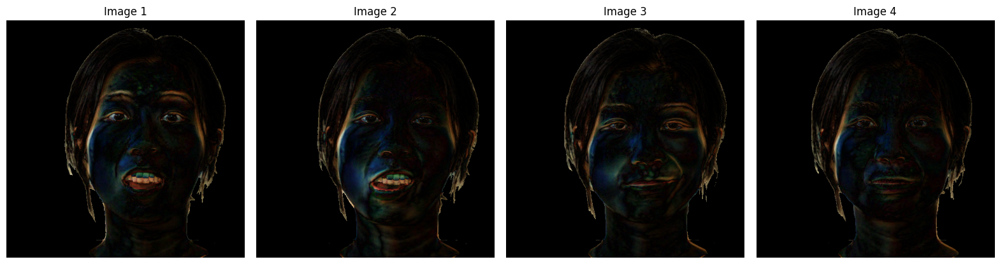

In [21]:
visualize_image_batch(error_mask_l1.permute(0, 2, 3, 1))

## Rgbx prediction

In [23]:
albedo = torch.stack(
    [
        load_img(str(path_config.diffusion_dir / path_config.eval_dir[0] / "albedo" / f"{frame}.png")).permute(1,2,0) # flare requires H, W, C
        for frame in views["frame_name"]
    ]
)

roughness = torch.stack(
    [
        load_img(str(path_config.diffusion_dir / path_config.eval_dir[0] / "roughness" / f"{frame}.png")).permute(1,2,0) # flare requires H, W, C
        for frame in views["frame_name"]
    ]
)

roughness1c = roughness[..., :1]

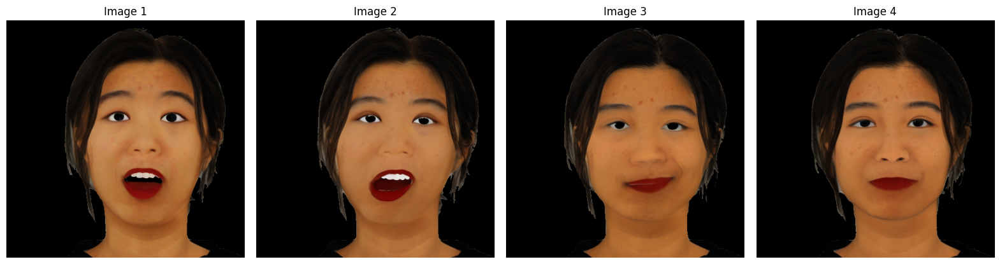

In [24]:
visualize_image_batch(albedo * views["mask"].cpu())

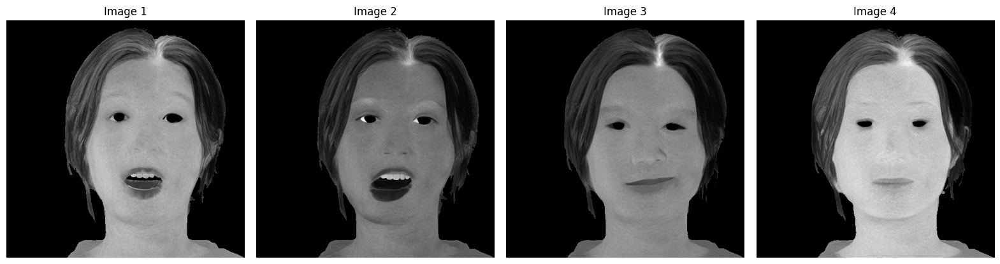

In [25]:
visualize_image_batch(roughness1c * views["mask"].cpu())

In [26]:
rgbx_rgb_pred, _, _ = patched_flare_inference(views, mesh, FLAMEServer, deformer_net, renderer, channels_gbuffer, shader_path="/home/jsickert/adl4cv/MODELS/001/stage_2/network_weights/shader_latest.pt", lgt=lgt, new_albedo=albedo)

STAGE 2: Using hashgrid (tinycudann) for intrinsic materials
{'material_mlp_ch': 5, 'light_mlp_ch': 3, 'material_mlp_dims': [64, 64], 'light_mlp_dims': [64, 64]}


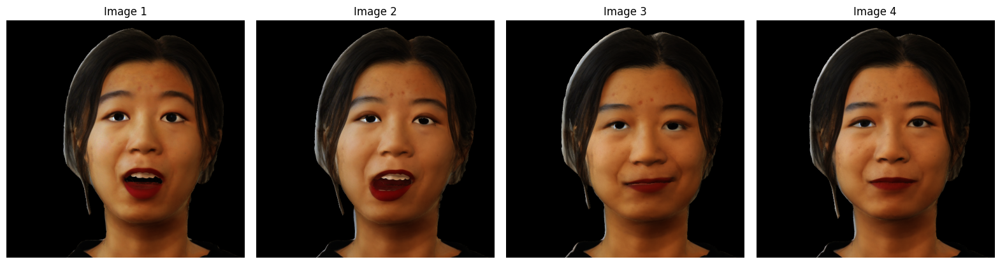

In [27]:
visualize_image_batch(rgbx_rgb_pred)

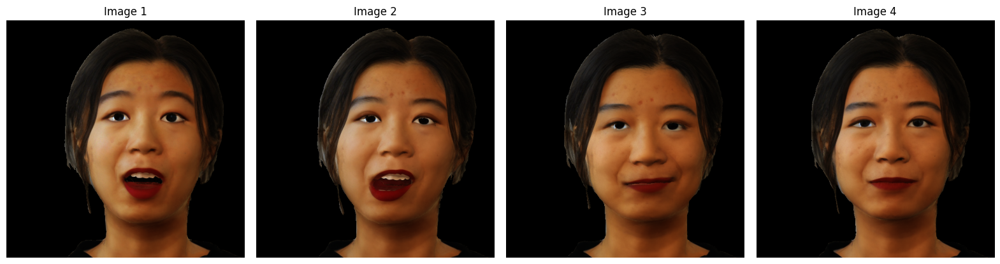

In [28]:
visualize_image_batch(rgbx_rgb_pred * views["mask"])

In [29]:
rgbx_pred, gt, mask = prepare_mask_for_metrics(rgbx_rgb_pred, views)

mse, error_mask_mse = img_mse(rgbx_pred, gt, mask=mask, use_mask=True, return_all=True)
l1, error_mask_l1 = img_mse(rgbx_pred, gt, mask=mask, use_mask=True, return_all=True, error_type="mae")

print("MSE  :", mse.mean())
print("L1   :", l1.mean())
print("SSIM :", img_ssim(masked_pred, gt).mean())
print("PSNR :", img_psnr(masked_pred, gt, mask=mask).mean())
print("LPIPS:", perceptual(masked_pred, gt).mean())

MSE  : tensor(0.0102)
L1   : tensor(0.0515)
SSIM : tensor(0.8302)
PSNR : tensor(19.9163)
LPIPS: tensor(0.1460)


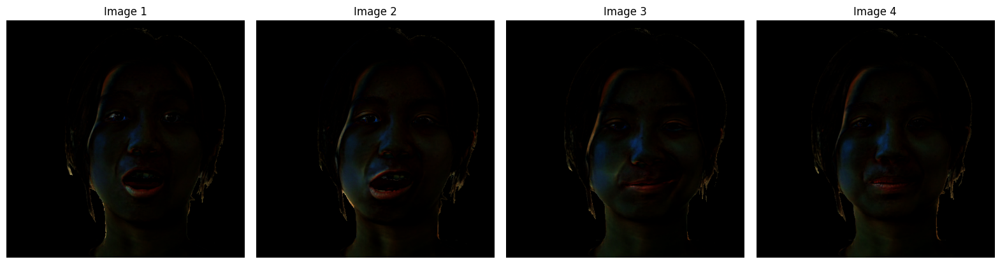

In [30]:
visualize_image_batch(error_mask_mse.permute(0, 2, 3, 1))

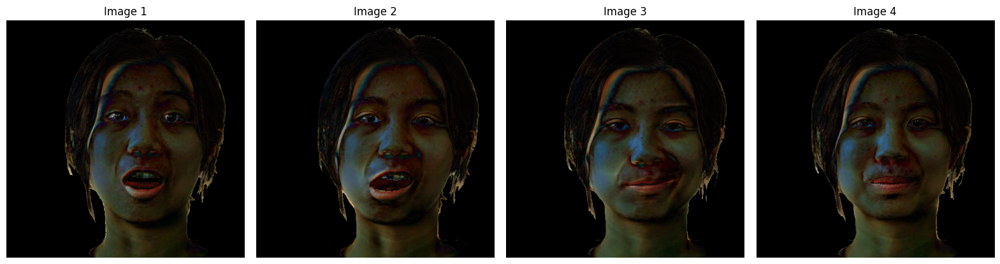

In [31]:
visualize_image_batch(error_mask_l1.permute(0, 2, 3, 1))

## Unwinding the immense mask confusion

- By default the input image `views["img"]` is masked with a 0/1 mask right at the beginning (which is loaded by `_load_mask` and is kind of broken).
- The predicted color is also masked by `gbuffers["mask"]`, which is again a 0/1 mask and is applied in this `torch.lerp` alongside with adding the alpha value. Seemingly this comes from the deformer net.
- Originally, all masks in the dataset are softmask, but this fact seems to be ignored throuhghout the whole codebase. Don't ask me why.
- Probably a more straighforward approach would be to use the softmask as is and first convert the three channels to one channels right after loading. See function `_better_load_mask`.

In [32]:
import imageio
import numpy as np

def _better_load_mask(fn: str):
    alpha = imageio.imread(fn).astype(np.float32)
    alpha = 0.299*alpha[...,0] + 0.587*alpha[...,1] + 0.114*alpha[...,2]
    alpha = torch.tensor(alpha).unsqueeze(-1)
    return alpha

## Diffusion renderer

In [33]:
diffusion_renderer_dir = Path("/home/jsickert/adl4cv/flare_diffusion_channels/diffusion_renderer/001")

dr_albedo = torch.stack(
    [
        load_img(str(diffusion_renderer_dir / path_config.eval_dir[0] / "albedo" / f"{frame}.png")).permute(1,2,0) # flare requires H, W, C
        for frame in views["frame_name"]
    ]
)

dr_roughness = torch.stack(
    [
        load_img(str(diffusion_renderer_dir / path_config.eval_dir[0] / "roughness" / f"{frame}.png")).permute(1,2,0) # flare requires H, W, C
        for frame in views["frame_name"]
    ]
)

dr_roughness1c = dr_roughness[..., :1]

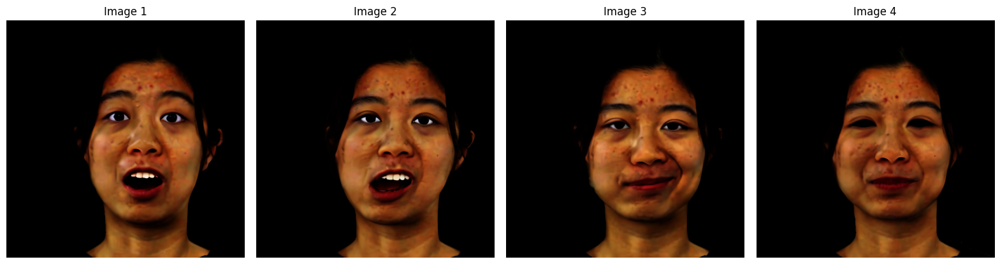

In [34]:
visualize_image_batch(dr_albedo * views["mask"].cpu())

In [37]:
dr_rgb_pred, _, _ = patched_flare_inference(views, mesh, FLAMEServer, deformer_net, renderer, channels_gbuffer, shader_path="/home/jsickert/adl4cv/MODELS/001/stage_2/network_weights/shader_latest.pt", lgt=lgt, new_albedo=dr_albedo, new_roughness=dr_roughness1c)

STAGE 2: Using hashgrid (tinycudann) for intrinsic materials
{'material_mlp_ch': 5, 'light_mlp_ch': 3, 'material_mlp_dims': [64, 64], 'light_mlp_dims': [64, 64]}


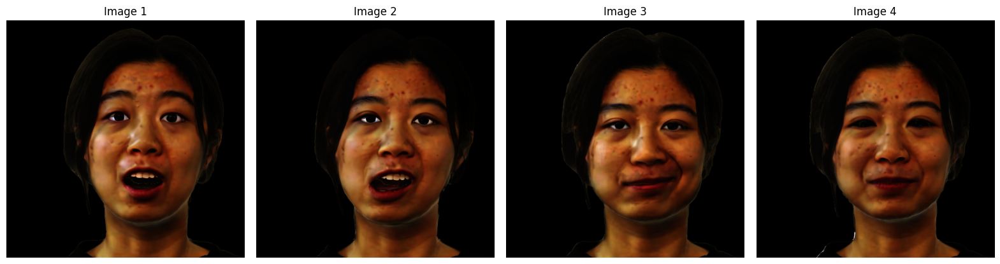

In [38]:
visualize_image_batch(dr_rgb_pred)

In [39]:
dr_pred, gt, mask = prepare_mask_for_metrics(dr_rgb_pred, views)

mse, error_mask_mse = img_mse(dr_pred, gt, mask=mask, use_mask=True, return_all=True)
l1, error_mask_l1 = img_mse(dr_pred, gt, mask=mask, use_mask=True, return_all=True, error_type="mae")

print("MSE  :", mse.mean())
print("L1   :", l1.mean())
print("SSIM :", img_ssim(masked_pred, gt).mean())
print("PSNR :", img_psnr(masked_pred, gt, mask=mask).mean())
print("LPIPS:", perceptual(masked_pred, gt).mean())

MSE  : tensor(0.0221)
L1   : tensor(0.0810)
SSIM : tensor(0.7634)
PSNR : tensor(16.5650)
LPIPS: tensor(0.2442)


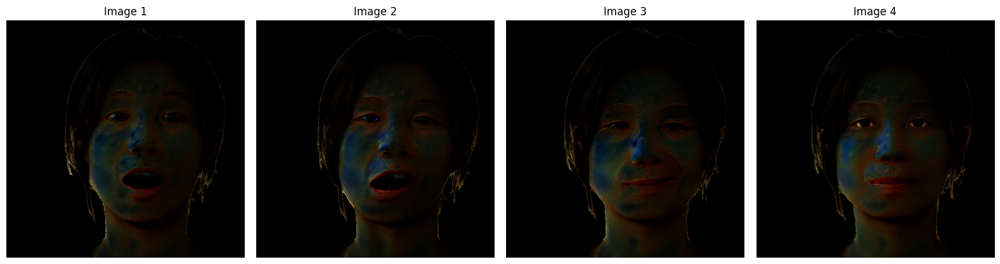

In [40]:
visualize_image_batch(error_mask_mse.permute(0, 2, 3, 1))

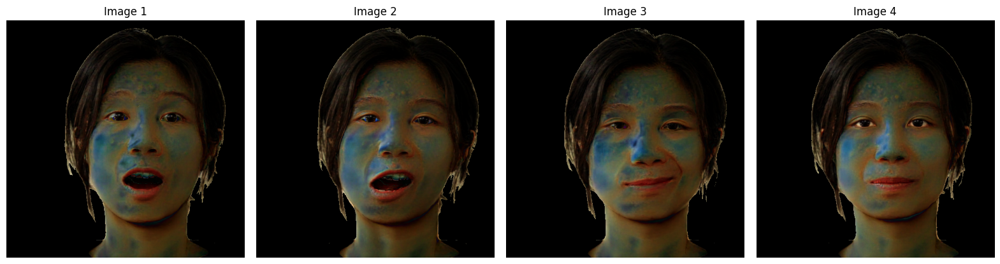

In [41]:
visualize_image_batch(error_mask_l1.permute(0, 2, 3, 1))

## Caveats
- There seam to be some issues with how rgb/srgb are treated (visibible as inconsistent saturation). Therefore we should look into this issue for more reliable results.
- The also might be some issues with how masks are applied.
- We dont have any ground truth for intrinsic channels. Thus comparing them solely relies on non-optimized re-rendering by overwriting material and lighting model outputs.
- Consistent image loading logic required for all sub-packages (flare, diffusion_renderer, rgbx)

## Results

### GT
```
MSE  : tensor(0.0043)
L1   : tensor(0.0253)
SSIM : tensor(0.8474)
PSNR : tensor(23.7165)
LPIPS: tensor(0.1393)
```

### RGBX
```
MSE  : tensor(0.0102)
L1   : tensor(0.0515)
SSIM : tensor(0.8302)
PSNR : tensor(19.9163)
LPIPS: tensor(0.1460)
```

### DiffusionRenderer
```
MSE  : tensor(0.0221)
L1   : tensor(0.0810)
SSIM : tensor(0.7634)
PSNR : tensor(16.5650)
LPIPS: tensor(0.2442)
```

- Generally speaking, overwriting MLP outputs with diffusion outputs worsened pixel-based metrics (such as PSNR, MSE, L1), where RGBX performed the worst.
- Percecptual based metrics did not worsen that much but also suffered some declines.
- There is a decline in performance, still as there is not optimization involved and some issues with masking and srgb disturb the metrics, the results are promising